In [85]:
#@title
# Device info
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Apr 10 11:08:36 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    35W / 250W |   1085MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Setup

In [86]:
# !git clone https://github.com/teddykoker/cryptopunks-gan

In [87]:
# !pip install -qq huggingface_hub
# !pip install -qq git+https://github.com/LysandreJik/huggingface_hub@auto-track-binary-files

In [118]:
!sudo apt-get install git-lfs
!git-lfs install

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  git-lfs
0 upgraded, 1 newly installed, 0 to remove and 39 not upgraded.
Need to get 2,129 kB of archives.
After this operation, 7,662 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 git-lfs amd64 2.3.4-1 [2,129 kB]
Fetched 2,129 kB in 0s (18.8 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package git-lfs.
(Reading database ... 156210 files and directories cu

In [119]:
!git config --global user.email "dimitreandrew@gmail.com"
!git config --global user.name "dimitreOliveira"
!git config --global credential.helper store

In [120]:
!huggingface-cli login


        _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
        _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
        _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
        _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
        _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

        To login, `huggingface_hub` now requires a token generated from https://huggingface.co/settings/tokens.
        (Deprecated, will be removed in v0.3.0) To login with username and password instead, interrupt with Ctrl+C.
        
Token: 
Login successful
Your token has been saved to /root/.huggingface/token


# Dependencies

In [91]:
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras.layers as L
from huggingface_hub import push_to_hub_keras

# Auxiliary functions

In [92]:
def plot_multiple_images(images, n_cols=None):
  n_cols = n_cols or len(images)
  n_rows = (len(images) - 1) // n_cols + 1
  if images.shape[-1] == 1:
    images = np.squeeze(images, axis=-1)
  plt.figure(figsize=(n_cols, n_rows))
  for index, image in enumerate(images):
    image = ((image + 1) / 2) # scale back
    plt.subplot(n_rows, n_cols, index + 1)
    plt.imshow(image, cmap="binary")
    plt.axis("off")
  plt.show()

def decode_img(inputs):
    file_path = inputs["paths"]
    img = tf.io.read_file(file_path)
    img = tf.io.decode_png(img, channels=img_shape[2])
    img = tf.image.resize(img, img_shape[:2])
    return img

def scale_img(img):
    img = (img / 255.) * 2 - 1 # scale images to be between -1 and 1
    return img

def get_dataset(filenames, ordered=False, cached=False, batch_size=32):
    dataset = (tf.data.Dataset.list_files(filenames)
                      .map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
                      .map(scale_img, num_parallel_calls=tf.data.AUTOTUNE)
              )
    
    if not ordered:
        dataset = dataset.shuffle(1024)
    dataset = dataset.batch(batch_size, drop_remainder=True)
    if cached:
        dataset = dataset.cache()
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [93]:
def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

@tf.function
def train_step(images, batch_size, codings_size):
  noise = tf.random.normal([batch_size, codings_size])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)

  gen_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
  disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  gen_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
  disc_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

def train(dataset, epochs, batch_size, codings_size):
  for epoch in range(epochs):
    for image_batch in dataset:
      train_step(image_batch, batch_size, codings_size)

    print(f"Epoch {epoch+1}/{epochs}")
    # Generate after the final epoch
    noise = tf.random.normal([batch_size, codings_size])
    display_images = generator(noise, training=False)
    plot_multiple_images(display_images, 8)

In [94]:
def generator_fn():
    inputs = L.Input(shape=(codings_size), dtype=tf.float32, name='inputs')
    x = L.Dense(6 * 6 * 256, use_bias=False)(inputs)
    x = L.BatchNormalization()(x)
    x = L.LeakyReLU(0.2)(x)
    x = L.Reshape([6, 6, 256])(x)

    x = L.Conv2DTranspose(128, kernel_size=5, strides=1, padding="same", 
                          use_bias=False)(x)
    x = L.BatchNormalization()(x)
    x = L.LeakyReLU(0.2)(x)

    x = L.Conv2DTranspose(64, kernel_size=5, strides=2, padding="same", 
                          use_bias=False)(x)
    x = L.BatchNormalization()(x)
    x = L.LeakyReLU(0.2)(x)

    outputs = L.Conv2DTranspose(img_shape[2], kernel_size=5, strides=2, 
                                padding="same", activation="tanh", 
                                use_bias=False)(x)

    return tf.keras.models.Model(inputs=inputs, outputs=outputs, name="generator")

def discriminator_fn():
    inputs = L.Input(shape=(img_shape), dtype=tf.float32, name='inputs')
    x = L.Conv2D(64, kernel_size=4, strides=2, padding="same", 
                          activation=L.LeakyReLU(0.2))(inputs)
    x = L.Dropout(0.4)(x)

    x = L.Conv2D(128, kernel_size=4, strides=2, padding="same", 
                          activation=L.LeakyReLU(0.2))(x)
    x = L.Dropout(0.4)(x)

    x = L.Conv2D(256, kernel_size=3, strides=2, padding="same", 
                          activation=L.LeakyReLU(0.2))(x)
    x = L.Dropout(0.4)(x)
    
    x = L.GlobalAveragePooling2D()(x)
    outputs = L.Dense(1, activation="sigmoid")(x)

    return tf.keras.models.Model(inputs=inputs, outputs=outputs, name="discriminator")

# Parameters

In [95]:
data_path = "/content/cryptopunks-gan/data/"
attributes_path = "/content/cryptopunks-gan/attributes/"
filenames = glob.glob(f"{data_path}*")
project_name = "crypto-gan"
organization = "huggan"
img_shape = (24, 24, 4)
codings_size = 100
batch_size = 16
epochs = 200

# Dataset

In [96]:
df = pd.concat([pd.read_csv(f) for f in glob.glob(f"{attributes_path}*.csv")])
df.id = df.id.apply(lambda x: f"{data_path}punk{x:03d}.png")
df.columns = [c.strip() for c in df.columns]
display(df.head())

,id,type,gender,skin tone,count,accessories
0,/content/cryptopunks-gan/data/punk7000.png,Human,Male,Dark,2,Messy Hair / Classic Shades
1,/content/cryptopunks-gan/data/punk7001.png,Human,Male,Medium,4,Police Cap / Chinstrap / Vape / Regular Shades
2,/content/cryptopunks-gan/data/punk7002.png,Human,Male,Dark,3,Cigarette / Normal Beard Black / Knitted Cap
3,/content/cryptopunks-gan/data/punk7003.png,Human,Male,Dark,3,Stringy Hair / Mustache / Mole
4,/content/cryptopunks-gan/data/punk7004.png,Human,Male,Albino,2,Front Beard / Purple Hair


In [97]:
def get_dataset(input_dict, batch_size=32):
    dataset = (tf.data.Dataset.from_tensor_slices(input_dict)
                      .map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
                      .map(scale_img, num_parallel_calls=tf.data.AUTOTUNE)
                      .shuffle(1024)
                      # .batch(batch_size, drop_remainder=True)
                      # .prefetch(tf.data.AUTOTUNE)
              )
    return dataset


slice_cols = ['type', 'skin tone', 'count']
slices_ds = {col:df[col].unique() for col in slice_cols}
sampling_ds = []
for k, values in slices_ds.items():
  for value in values:
    sampling_ds.append(get_dataset({"paths": df[df[k] == value].id}, batch_size=batch_size))

# sampling_ds = [get_dataset({"paths": df.id}, batch_size=batch_size)]
dataset = (tf.data.Dataset.sample_from_datasets(sampling_ds)
                          .batch(batch_size)
                          .prefetch(tf.data.AUTOTUNE))

In [98]:
slice_cols = ['type', 'skin tone', 'count']
slices_ds = {col:df[col].unique() for col in slice_cols}
for k, values in slices_ds.items():
  for value in values:
    print(k, value, len(df[df[k] == value]))

type  Human 9879
type  Zombie 88
type  Ape 24
type  Alien 9
skin tone  Dark 2824
skin tone  Medium 3031
skin tone  Albino 1018
skin tone  Light 3006
skin tone   121
count 2 3560
count 4 1420
count 3 4501
count 5 166
count 1 333
count 6 11
count 7 1
count 0 8


# Model

## Generator

In [99]:
generator = generator_fn()
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 100)]             0         
                                                                 
 dense_8 (Dense)             (None, 9216)              921600    
                                                                 
 batch_normalization_12 (Bat  (None, 9216)             36864     
 chNormalization)                                                
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 9216)              0         
                                                                 
 reshape_4 (Reshape)         (None, 6, 6, 256)         0         
                                                                 
 conv2d_transpose_12 (Conv2D  (None, 6, 6, 128)        819200    
 Transpose)                                              

## Discriminator

In [100]:
discriminator = discriminator_fn()
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 24, 24, 4)]       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 12, 12, 64)        4160      
                                                                 
 dropout_12 (Dropout)        (None, 12, 12, 64)        0         
                                                                 
 conv2d_13 (Conv2D)          (None, 6, 6, 128)         131200    
                                                                 
 dropout_13 (Dropout)        (None, 6, 6, 128)         0         
                                                                 
 conv2d_14 (Conv2D)          (None, 3, 3, 256)         295168    
                                                                 
 dropout_14 (Dropout)        (None, 3, 3, 256)       

In [101]:
gen_optimizer = tf.keras.optimizers.RMSprop()
disc_optimizer = tf.keras.optimizers.RMSprop()
cross_entropy = tf.keras.losses.BinaryCrossentropy()

# Training

Epoch 1/200


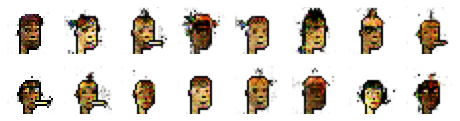

Epoch 2/200


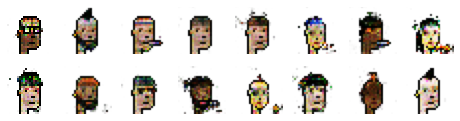

Epoch 3/200


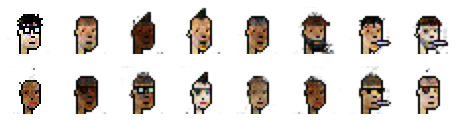

Epoch 4/200


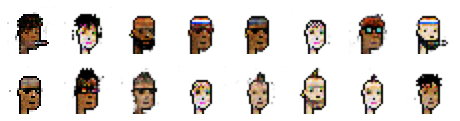

Epoch 5/200


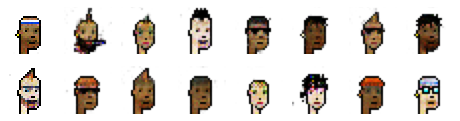

Epoch 6/200


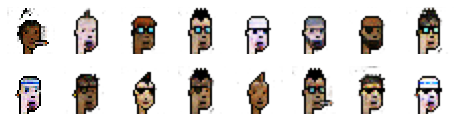

Epoch 7/200


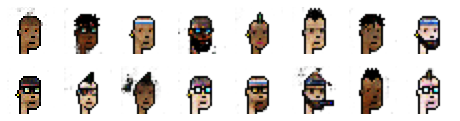

Epoch 8/200


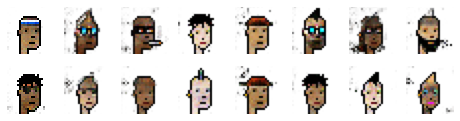

Epoch 9/200


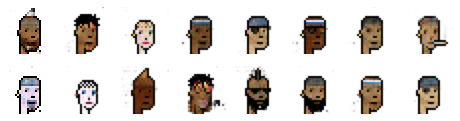

Epoch 10/200


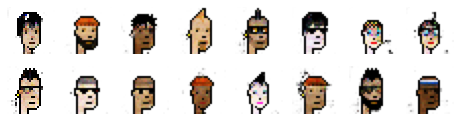

Epoch 11/200


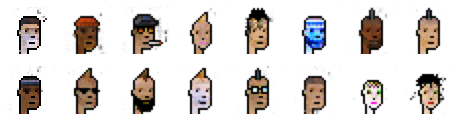

Epoch 12/200


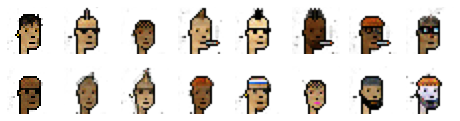

Epoch 13/200


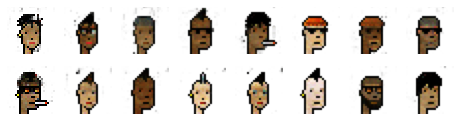

Epoch 14/200


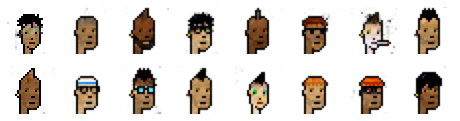

Epoch 15/200


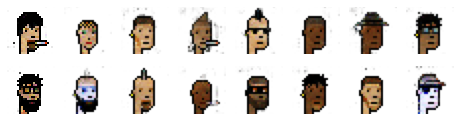

Epoch 16/200


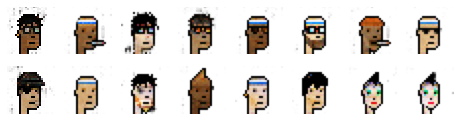

Epoch 17/200


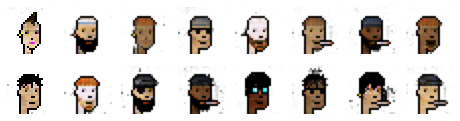

Epoch 18/200


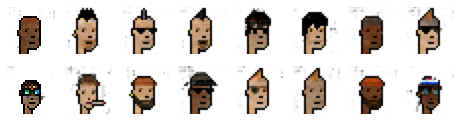

Epoch 19/200


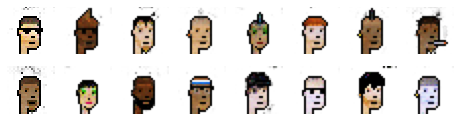

Epoch 20/200


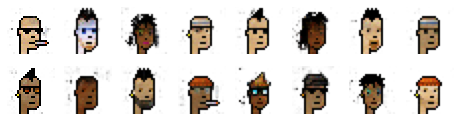

Epoch 21/200


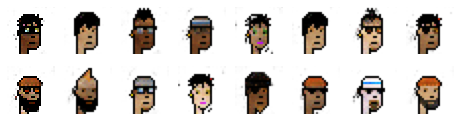

Epoch 22/200


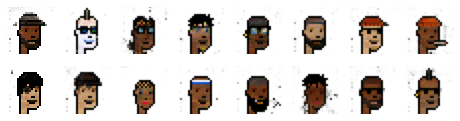

Epoch 23/200


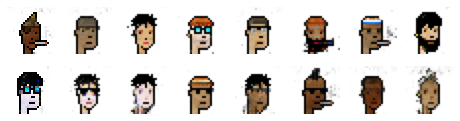

Epoch 24/200


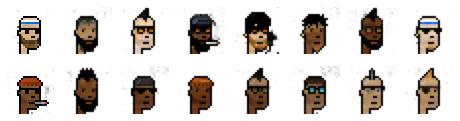

Epoch 25/200


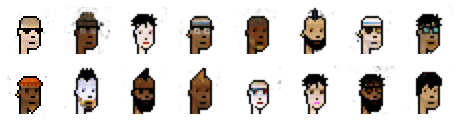

Epoch 26/200


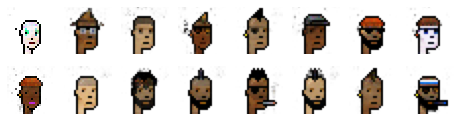

Epoch 27/200


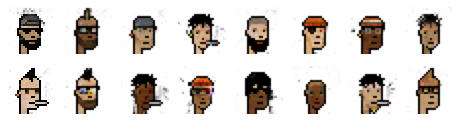

Epoch 28/200


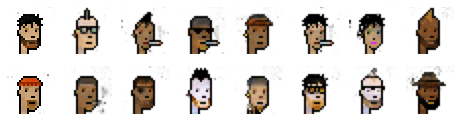

Epoch 29/200


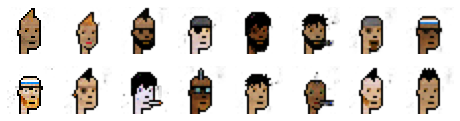

Epoch 30/200


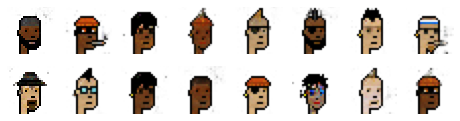

Epoch 31/200


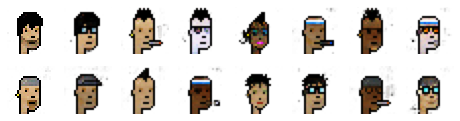

Epoch 32/200


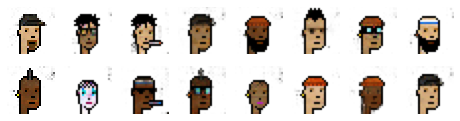

Epoch 33/200


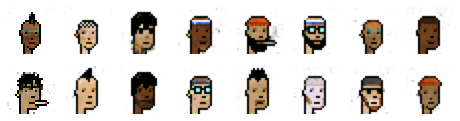

Epoch 34/200


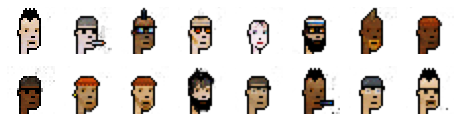

Epoch 35/200


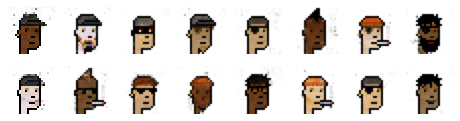

Epoch 36/200


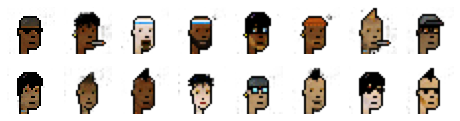

Epoch 37/200


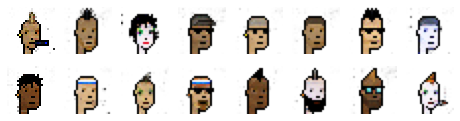

Epoch 38/200


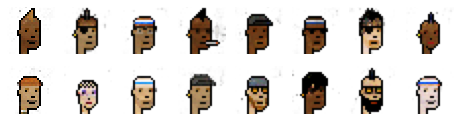

Epoch 39/200


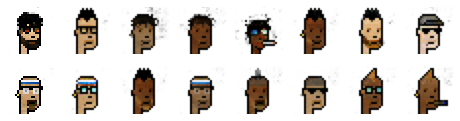

Epoch 40/200


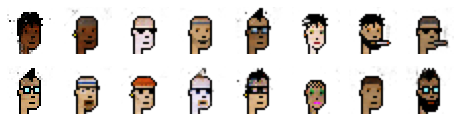

Epoch 41/200


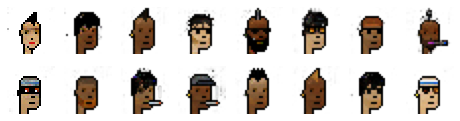

Epoch 42/200


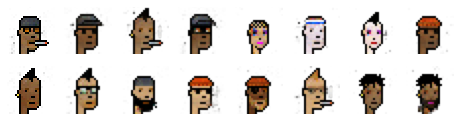

Epoch 43/200


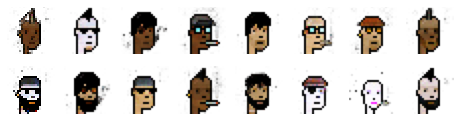

Epoch 44/200


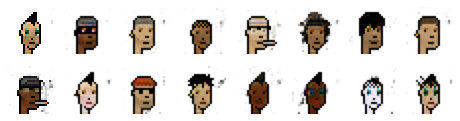

Epoch 45/200


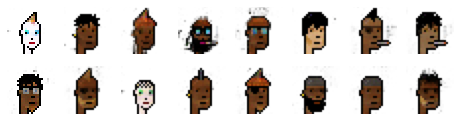

Epoch 46/200


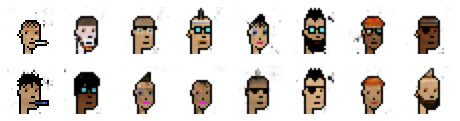

Epoch 47/200


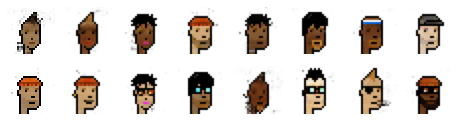

Epoch 48/200


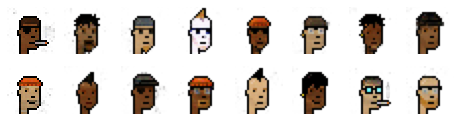

Epoch 49/200


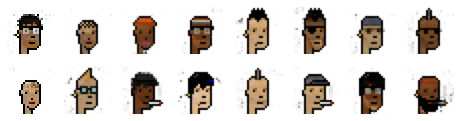

Epoch 50/200


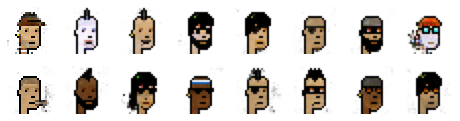

Epoch 51/200


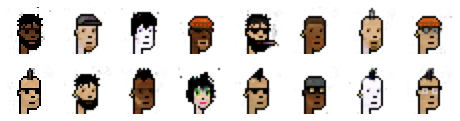

Epoch 52/200


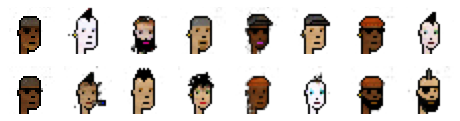

Epoch 53/200


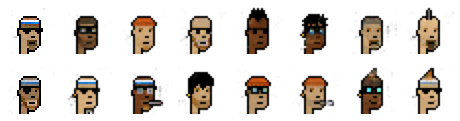

Epoch 54/200


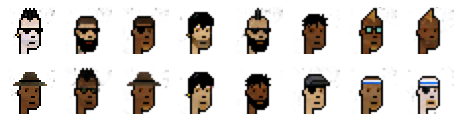

Epoch 55/200


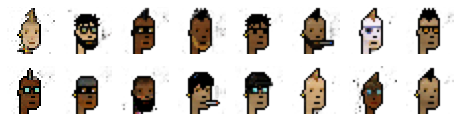

Epoch 56/200


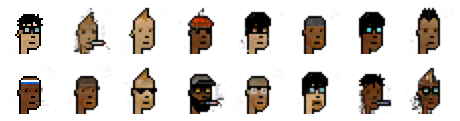

Epoch 57/200


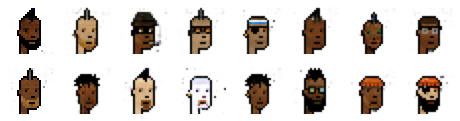

Epoch 58/200


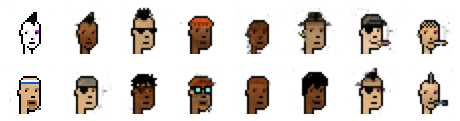

Epoch 59/200


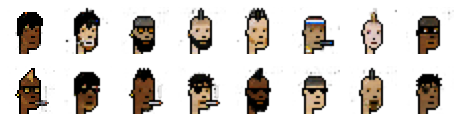

Epoch 60/200


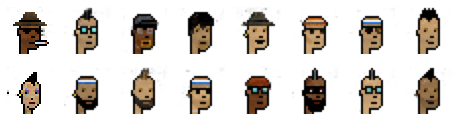

Epoch 61/200


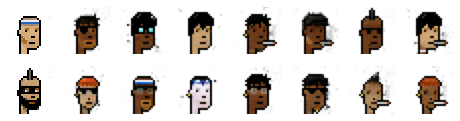

Epoch 62/200


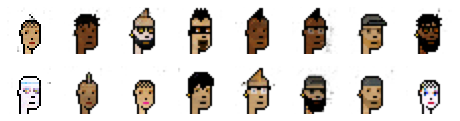

Epoch 63/200


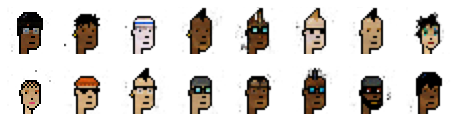

Epoch 64/200


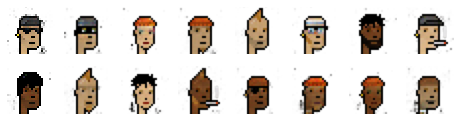

Epoch 65/200


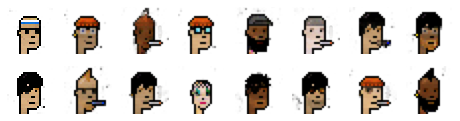

Epoch 66/200


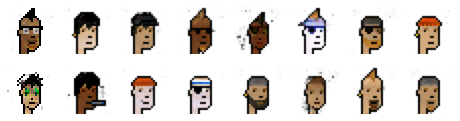

Epoch 67/200


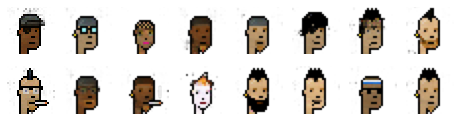

Epoch 68/200


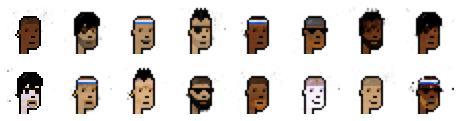

Epoch 69/200


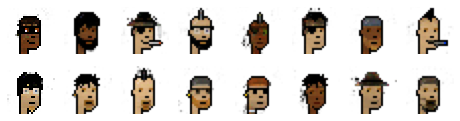

Epoch 70/200


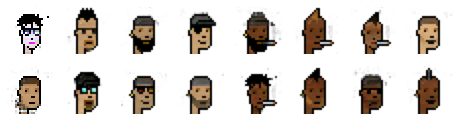

Epoch 71/200


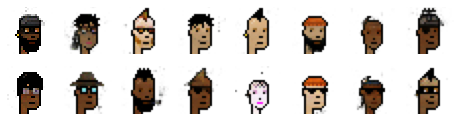

Epoch 72/200


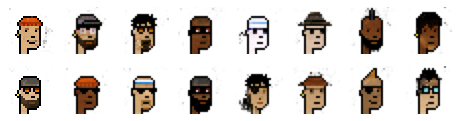

Epoch 73/200


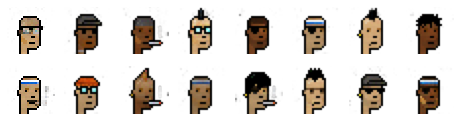

Epoch 74/200


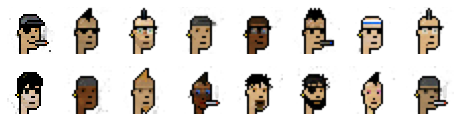

Epoch 75/200


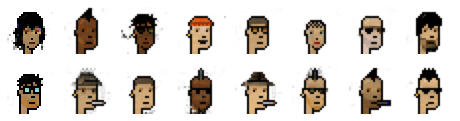

Epoch 76/200


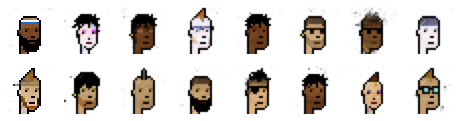

Epoch 77/200


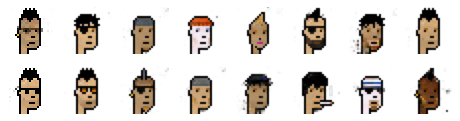

Epoch 78/200


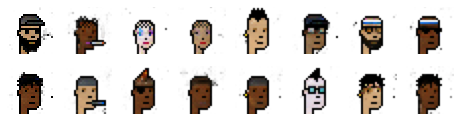

Epoch 79/200


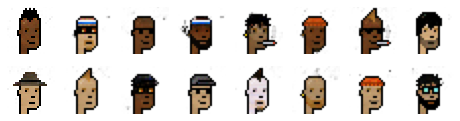

Epoch 80/200


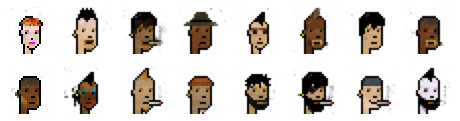

Epoch 81/200


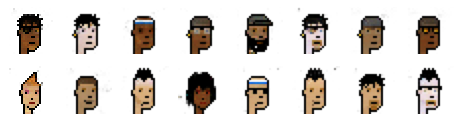

Epoch 82/200


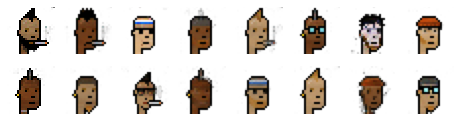

Epoch 83/200


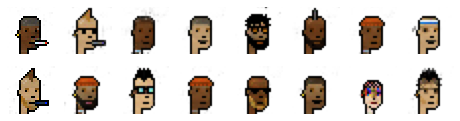

Epoch 84/200


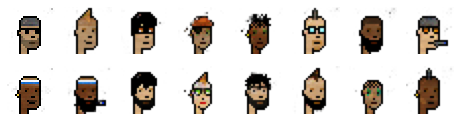

Epoch 85/200


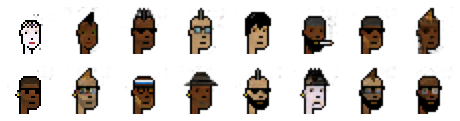

Epoch 86/200


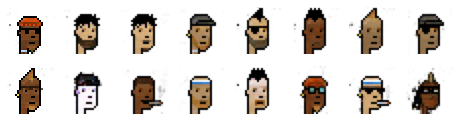

Epoch 87/200


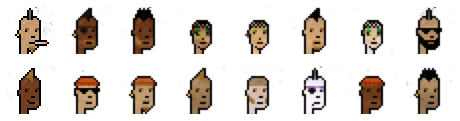

Epoch 88/200


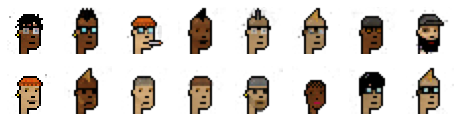

Epoch 89/200


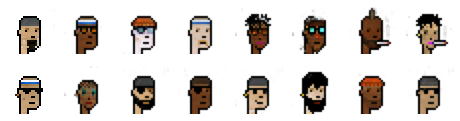

Epoch 90/200


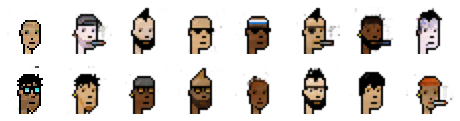

Epoch 91/200


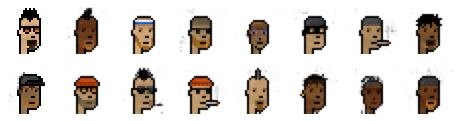

Epoch 92/200


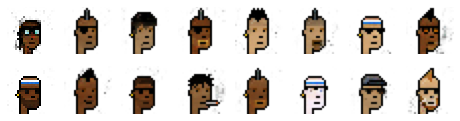

Epoch 93/200


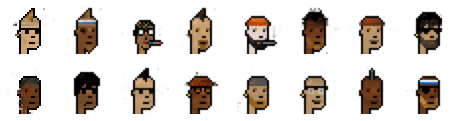

Epoch 94/200


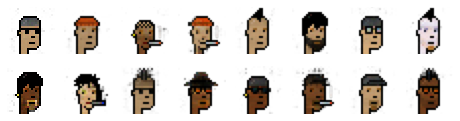

Epoch 95/200


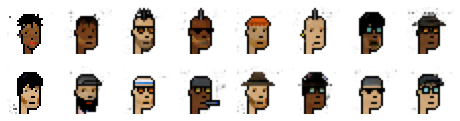

Epoch 96/200


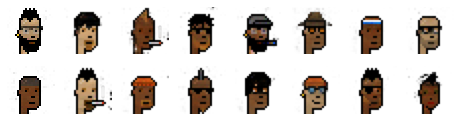

Epoch 97/200


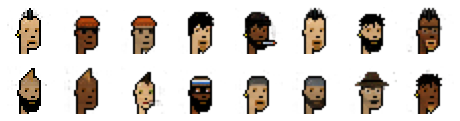

Epoch 98/200


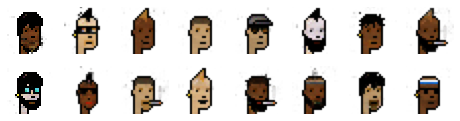

Epoch 99/200


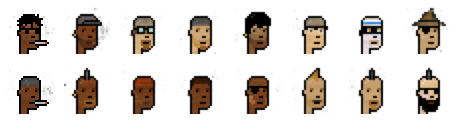

Epoch 100/200


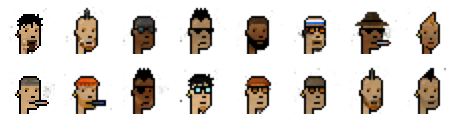

Epoch 101/200


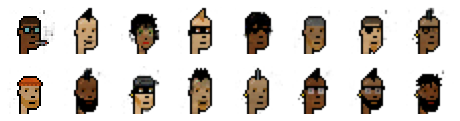

Epoch 102/200


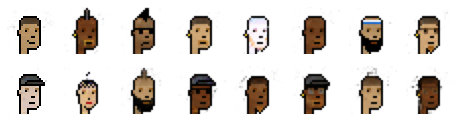

Epoch 103/200


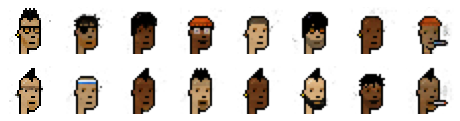

Epoch 104/200


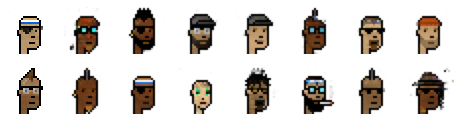

Epoch 105/200


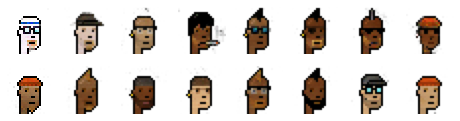

Epoch 106/200


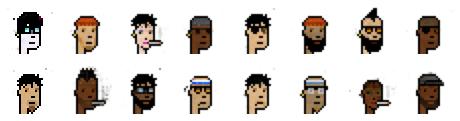

Epoch 107/200


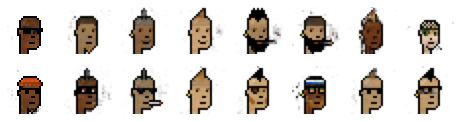

Epoch 108/200


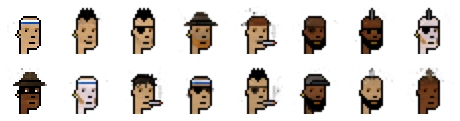

Epoch 109/200


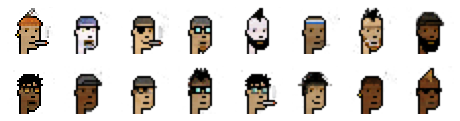

Epoch 110/200


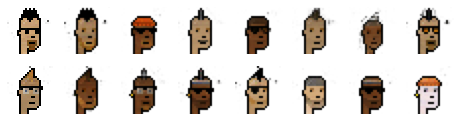

Epoch 111/200


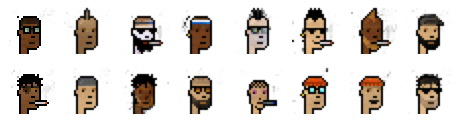

Epoch 112/200


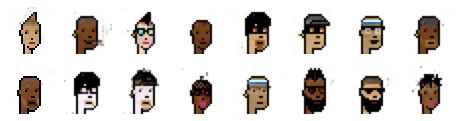

Epoch 113/200


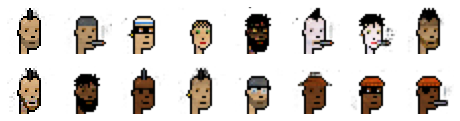

Epoch 114/200


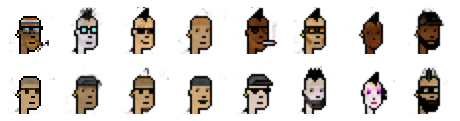

Epoch 115/200


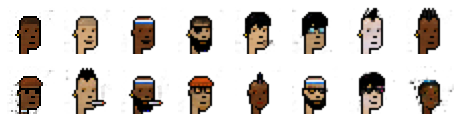

Epoch 116/200


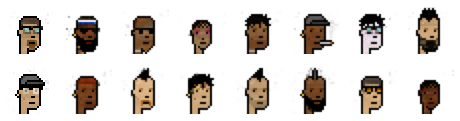

Epoch 117/200


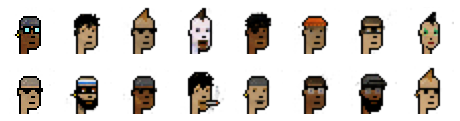

Epoch 118/200


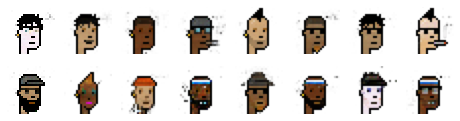

Epoch 119/200


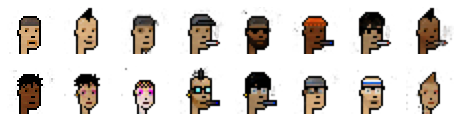

Epoch 120/200


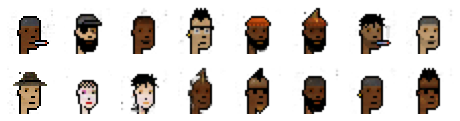

Epoch 121/200


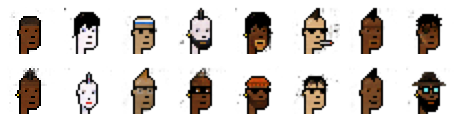

Epoch 122/200


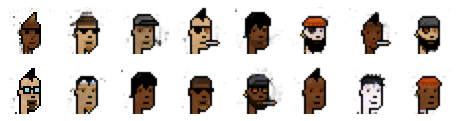

Epoch 123/200


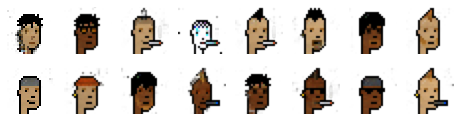

Epoch 124/200


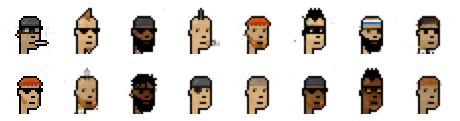

Epoch 125/200


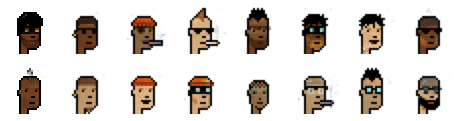

Epoch 126/200


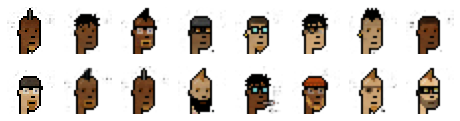

Epoch 127/200


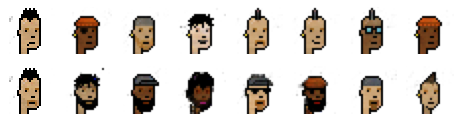

Epoch 128/200


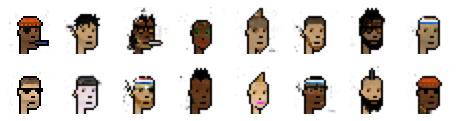

Epoch 129/200


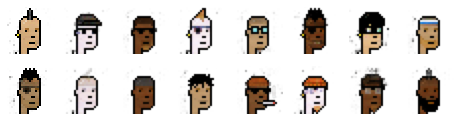

Epoch 130/200


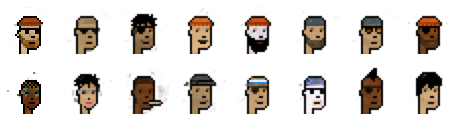

Epoch 131/200


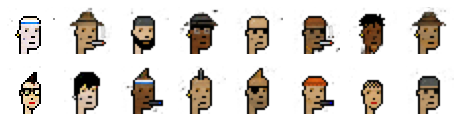

Epoch 132/200


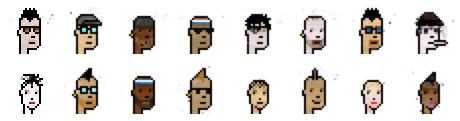

Epoch 133/200


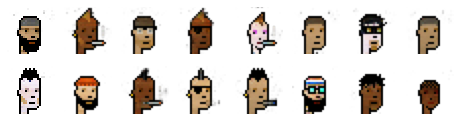

Epoch 134/200


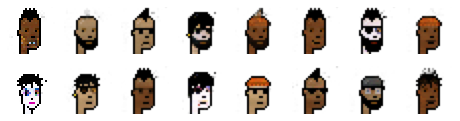

Epoch 135/200


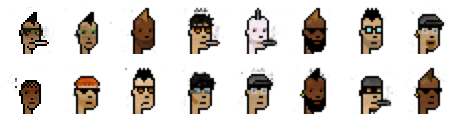

Epoch 136/200


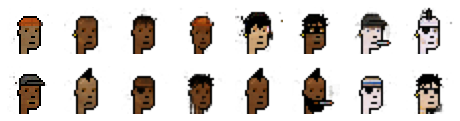

Epoch 137/200


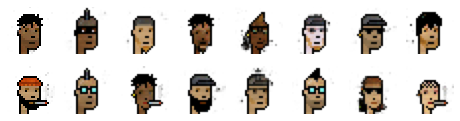

Epoch 138/200


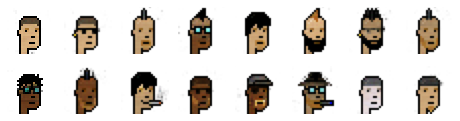

Epoch 139/200


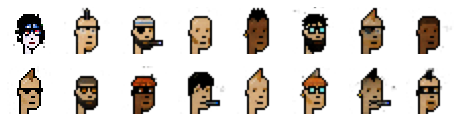

Epoch 140/200


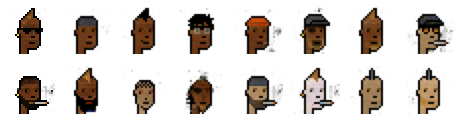

Epoch 141/200


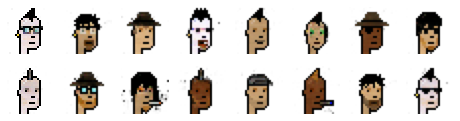

Epoch 142/200


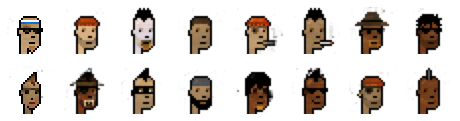

Epoch 143/200


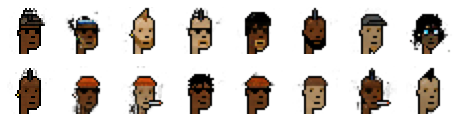

Epoch 144/200


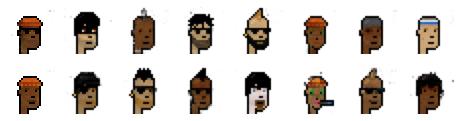

Epoch 145/200


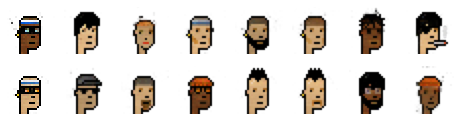

Epoch 146/200


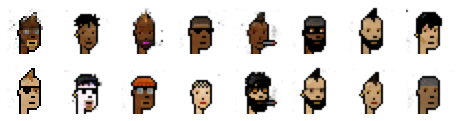

Epoch 147/200


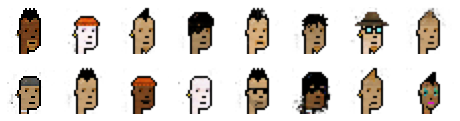

Epoch 148/200


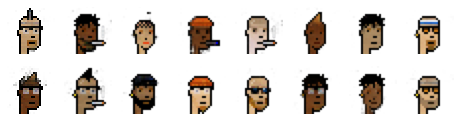

Epoch 149/200


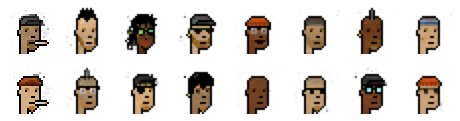

Epoch 150/200


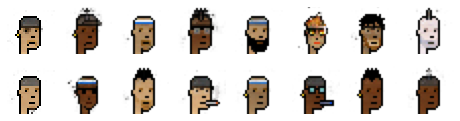

Epoch 151/200


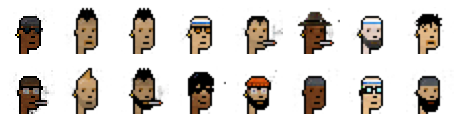

Epoch 152/200


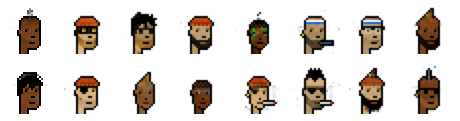

Epoch 153/200


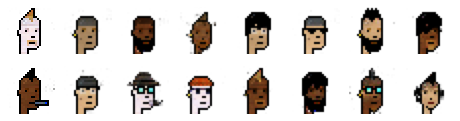

Epoch 154/200


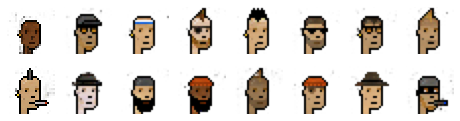

Epoch 155/200


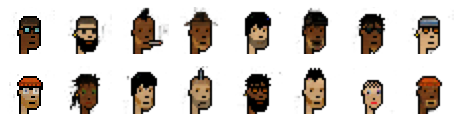

Epoch 156/200


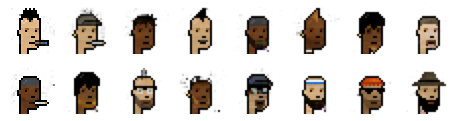

Epoch 157/200


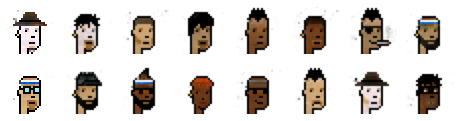

Epoch 158/200


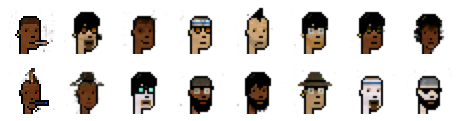

Epoch 159/200


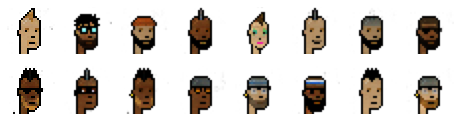

Epoch 160/200


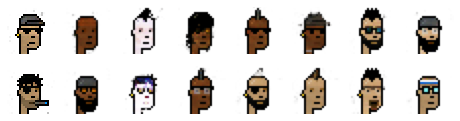

Epoch 161/200


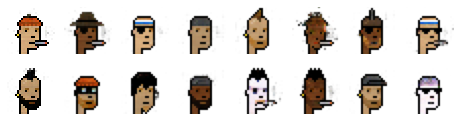

Epoch 162/200


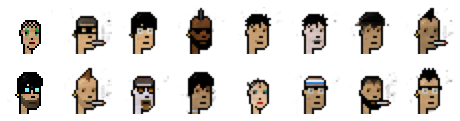

Epoch 163/200


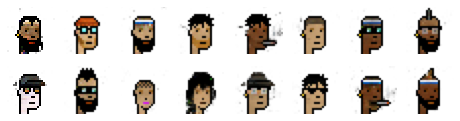

Epoch 164/200


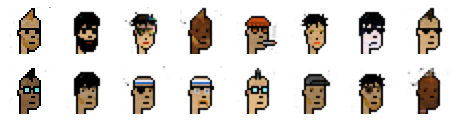

Epoch 165/200


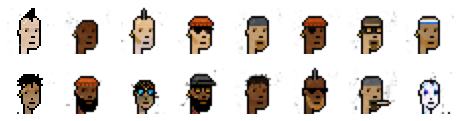

Epoch 166/200


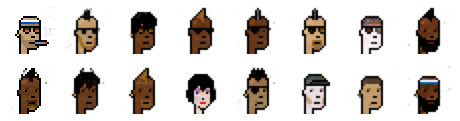

Epoch 167/200


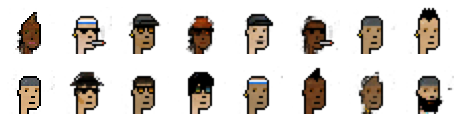

Epoch 168/200


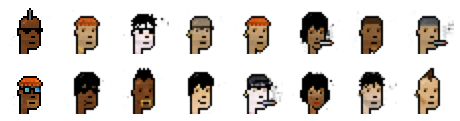

Epoch 169/200


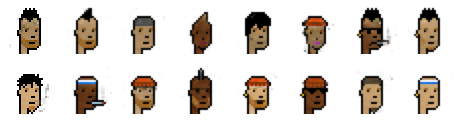

Epoch 170/200


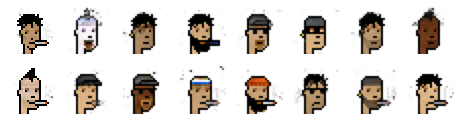

Epoch 171/200


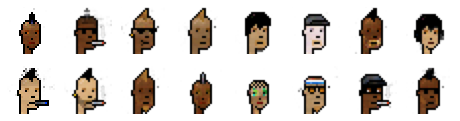

Epoch 172/200


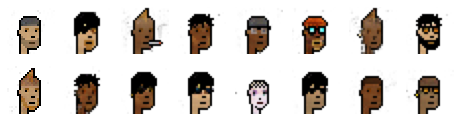

Epoch 173/200


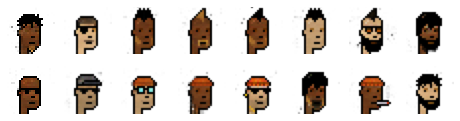

Epoch 174/200


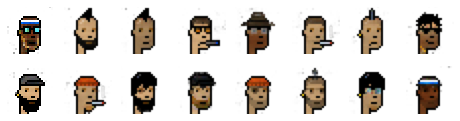

Epoch 175/200


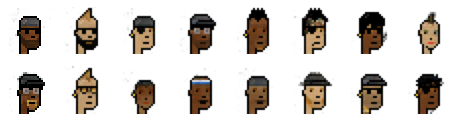

Epoch 176/200


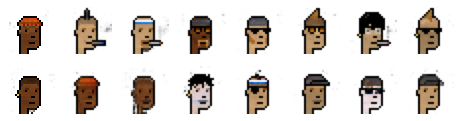

Epoch 177/200


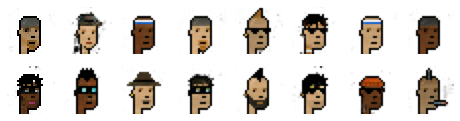

Epoch 178/200


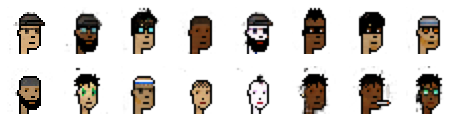

Epoch 179/200


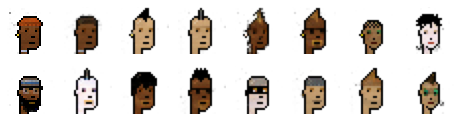

Epoch 180/200


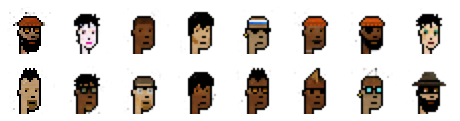

Epoch 181/200


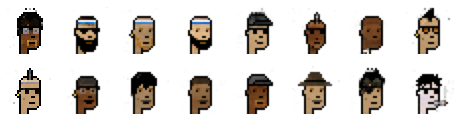

Epoch 182/200


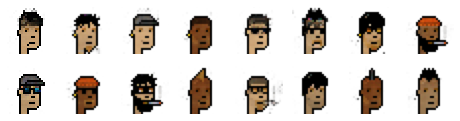

Epoch 183/200


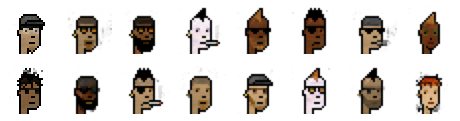

Epoch 184/200


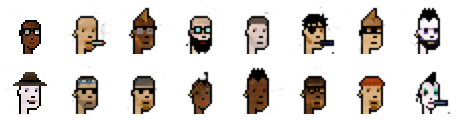

Epoch 185/200


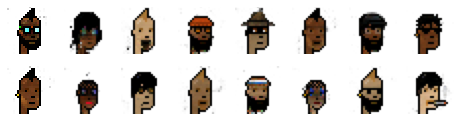

Epoch 186/200


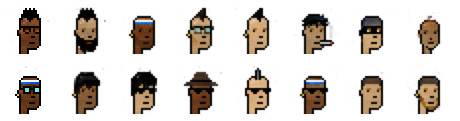

Epoch 187/200


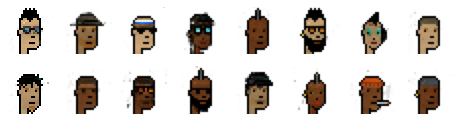

Epoch 188/200


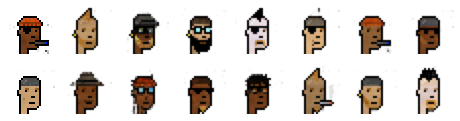

Epoch 189/200


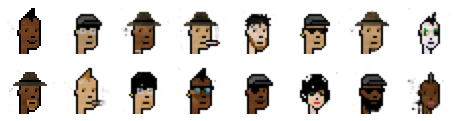

Epoch 190/200


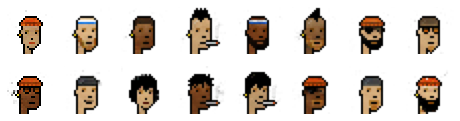

Epoch 191/200


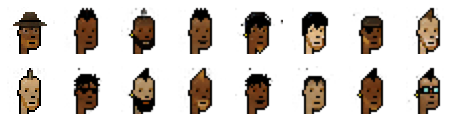

Epoch 192/200


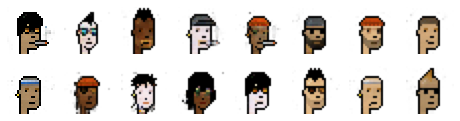

Epoch 193/200


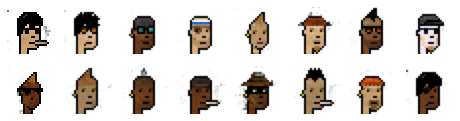

Epoch 194/200


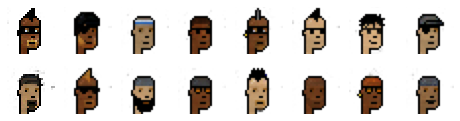

Epoch 195/200


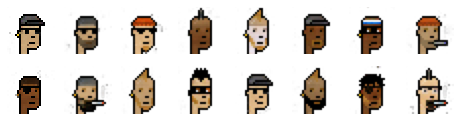

Epoch 196/200


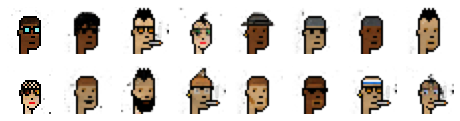

Epoch 197/200


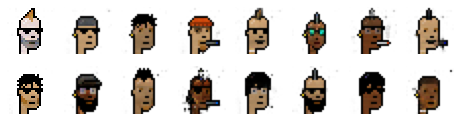

Epoch 198/200


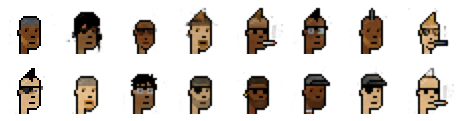

Epoch 199/200


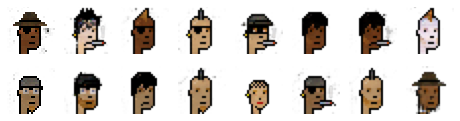

Epoch 200/200


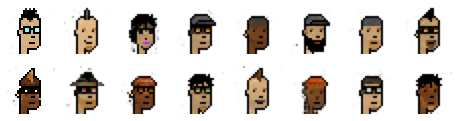

In [102]:
train(dataset, epochs, batch_size, codings_size)

# Push to HF hub

In [121]:
# Push to HuggingFace Hub
push_to_hub_keras(generator, 
                  repo_path_or_name=project_name, 
                  organization=organization)

Cloning https://huggingface.co/huggan/crypto-gan into local empty directory.


Download file variables/variables.data-00000-of-00001:   0%|          | 1.41k/7.60M [00:00<?, ?B/s]

Download file model.png:   9%|9         | 3.47k/38.3k [00:00<?, ?B/s]

Download file saved_model.pb:   2%|1         | 3.47k/186k [00:00<?, ?B/s]

Download file keras_metadata.pb:  14%|#4        | 3.47k/24.0k [00:00<?, ?B/s]

Download file variables/variables.index: 100%|##########| 1.17k/1.17k [00:00<?, ?B/s]

Clean file model.png:   3%|2         | 1.00k/38.3k [00:00<?, ?B/s]

Clean file variables/variables.index:  86%|########5 | 1.00k/1.17k [00:00<?, ?B/s]

Clean file keras_metadata.pb:   4%|4         | 1.00k/24.0k [00:00<?, ?B/s]

Clean file saved_model.pb:   1%|          | 1.00k/186k [00:00<?, ?B/s]

Clean file variables/variables.data-00000-of-00001:   0%|          | 1.00k/7.60M [00:00<?, ?B/s]

INFO:tensorflow:Assets written to: crypto-gan/assets


Upload file variables/variables.data-00000-of-00001:   0%|          | 3.34k/7.60M [00:00<?, ?B/s]

Upload file keras_metadata.pb:  14%|#3        | 3.34k/24.2k [00:00<?, ?B/s]

Upload file saved_model.pb:   2%|1         | 3.34k/187k [00:00<?, ?B/s]

Upload file variables/variables.index: 100%|##########| 1.17k/1.17k [00:00<?, ?B/s]

Upload file model.png:   8%|8         | 3.34k/41.4k [00:00<?, ?B/s]

To https://huggingface.co/huggan/crypto-gan
   d62a5dd..86c0567  main -> main



'https://huggingface.co/huggan/crypto-gan/commit/86c056732d14544302a858309ed6b57d70e67d53'

# Test from Hub

In [122]:
def post_process(image):
    image = ((image + 1) / 2) # scale back
    return image

def generate(seed):
    noise = tf.random.normal(shape=[n_images, codings_size], seed=seed)
    generated_images = hub_generator(noise, training=False)

    fig = plt.figure(figsize=(10, 10))
    for i in range(generated_images.shape[0]):
        plt.subplot(6, 6, i+1)
        plt.imshow(post_process(generated_images[i, :, :, :]), cmap="binary")
        plt.axis('off')
    plt.show( )# return fig

In [123]:
from huggingface_hub import from_pretrained_keras

In [124]:
hub_generator = from_pretrained_keras(f"{organization}/{project_name}")
# hub_generator = generator
hub_generator.summary()

config.json not found in HuggingFace Hub


Downloading:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/334 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/24.8k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/42.4k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/192k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/7.97M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.20k [00:00<?, ?B/s]

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inputs (InputLayer)         [(None, 100)]             0         
                                                                 
 dense_8 (Dense)             (None, 9216)              921600    
                                                                 
 batch_normalization_12 (Bat  (None, 9216)             36864     
 chNormalization)                                                
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 9216)              0         
                                                                 
 reshape_4 (Reshape)         (None, 6, 6, 256)         0         
                                                                 
 conv2d_transpose_12 (Conv2D  (None, 6, 6, 128)        819200    
 Transpose)                                              

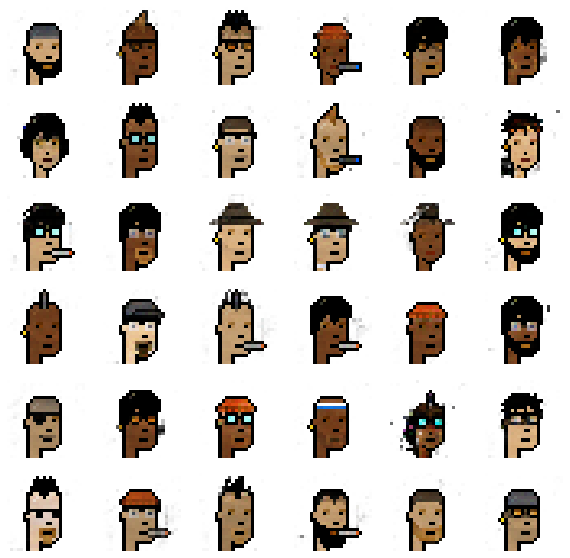

In [128]:
n_images = 36
codings_size = 100

generate(22)